# File and libraries

In [1]:
import pandas as pd
import numpy as np


filepath=r'data/retail_store_inventory_time_pre_proc.csv'

file_tag = "Retail Store Inventory"


## DSLabs

In [2]:
%run "scripts/dslabs_functions.py"


# data functions

In [3]:
%run "scripts/data_functions.py"

data_functions loaded


# Load

In [7]:
# test_data=True
test_data=False

if test_data:
    data = pd.read_csv(filepath, decimal=".")
else:
    data = pd.read_csv(filepath, decimal=".")

# Parse the date and set it as the index
data['Date'] = pd.to_datetime(data['Date'], infer_datetime_format=True)
data.set_index('Date', inplace=True)

data.info()


<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 1462 entries, 2022-01-01 to 2024-01-01
Data columns (total 23 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   Holiday/Promotion              1462 non-null   int64  
 1   nunique_Demand Forecast_East   1462 non-null   float64
 2   nunique_Demand Forecast_North  1462 non-null   float64
 3   nunique_Demand Forecast_South  1462 non-null   float64
 4   nunique_Demand Forecast_West   1462 non-null   float64
 5   nunique_Inventory Level_East   1462 non-null   int64  
 6   nunique_Inventory Level_North  1462 non-null   int64  
 7   nunique_Inventory Level_South  1462 non-null   int64  
 8   nunique_Inventory Level_West   1462 non-null   int64  
 9   nunique_Units Ordered_East     1462 non-null   int64  
 10  nunique_Units Ordered_North    1462 non-null   int64  
 11  nunique_Units Ordered_South    1462 non-null   int64  
 12  nunique_Units Ordered_West    

# Dimensionality

c:\ProgramData\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:77: DeprecationWarning: backend2gui is deprecated since IPython 8.24, backends are managed in matplotlib and can be externally registered.
  warnings.warn(
c:\ProgramData\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:77: DeprecationWarning: backend2gui is deprecated since IPython 8.24, backends are managed in matplotlib and can be externally registered.
  warnings.warn(
c:\ProgramData\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:77: DeprecationWarning: backend2gui is deprecated since IPython 8.24, backends are managed in matplotlib and can be externally registered.
  warnings.warn(


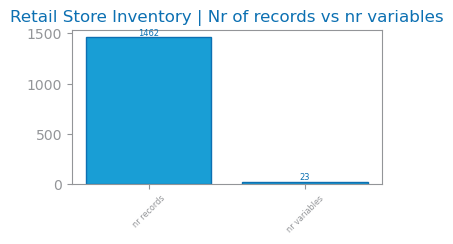

In [8]:
from matplotlib.pyplot import figure, savefig, show
from dslabs_functions import plot_bar_chart

figure(figsize=(4, 2))
values: dict[str, int] = {"nr records": data.shape[0], "nr variables": data.shape[1]}
plot_bar_chart(
    list(values.keys()), list(values.values()), title=f"{file_tag} | Nr of records vs nr variables"
)
# savefig(f"{file_tag}_records_variables.png")
show()

## Missing values

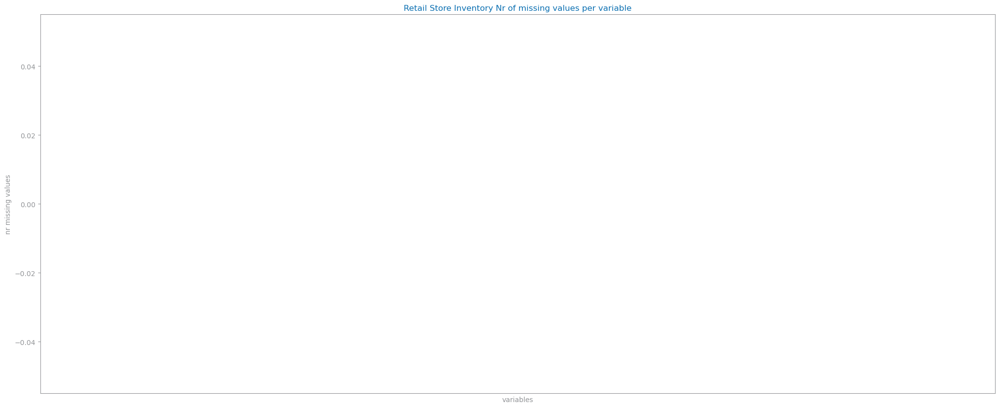

In [9]:
from matplotlib.pyplot import figure, savefig, show
from dslabs_functions import plot_bar_chart

mv: dict[str, int] = {}
total_rows = len(data)

for var in data.columns:
    nr: int = data[var].isna().sum()
    if nr > 0:
        percentage = (nr / total_rows) * 100
        mv[var] = (nr, percentage)

sorted_mv = dict(sorted(mv.items(), key=lambda item: item[1][0], reverse=True))

variables = list(sorted_mv.keys())
missing_values = [val[0] for val in sorted_mv.values()]
percentages = [val[1] for val in sorted_mv.values()]

figure(figsize=(25, 10)) #(largura,altura) 

plot_bar_chart(
    variables,
    missing_values,
    title=f"{file_tag} Nr of missing values per variable",
    xlabel="variables",
    ylabel="nr missing values",
)
for i, (var, perc) in enumerate(zip(variables, percentages)):
    text(i, missing_values[i] + max(missing_values) * 0.08, f"{perc:.1f}%", ha="center", va="center_baseline")

savefig(f"images/{file_tag}_mv.png")
show()

## Variables Type

In [10]:
data.dtypes


Holiday/Promotion                  int64
nunique_Demand Forecast_East     float64
nunique_Demand Forecast_North    float64
nunique_Demand Forecast_South    float64
nunique_Demand Forecast_West     float64
nunique_Inventory Level_East       int64
nunique_Inventory Level_North      int64
nunique_Inventory Level_South      int64
nunique_Inventory Level_West       int64
nunique_Units Ordered_East         int64
nunique_Units Ordered_North        int64
nunique_Units Ordered_South        int64
nunique_Units Ordered_West         int64
nunique_Units Sold_East            int64
nunique_Units Sold_North           int64
nunique_Units Sold_South           int64
nunique_Units Sold_West            int64
total_Inventory Level              int64
total_Units Sold                   int64
total_Units Ordered                int64
total_Demand Forecast            float64
day_of_week_nr                     int64
is_weekend                         int64
dtype: object

In [11]:
from pandas import Series, to_numeric, to_datetime


def get_variable_types(df: DataFrame) -> dict[str, list]:
    variable_types: dict = {"numeric": [], "binary": [], "date": [], "symbolic": []}

    nr_values: Series = df.nunique(axis=0, dropna=True)
    for c in df.columns:
        if 2 == nr_values[c]:
            variable_types["binary"].append(c)
            df[c].astype("bool")
        else:
            try:
                to_numeric(df[c], errors="raise")
                variable_types["numeric"].append(c)
            except ValueError:
                try:
                    df[c] = to_datetime(df[c], errors="raise")
                    variable_types["date"].append(c)
                except ValueError:
                    variable_types["symbolic"].append(c)

    return variable_types


variable_types: dict[str, list] = get_variable_types(data)
print(variable_types)

{'numeric': ['nunique_Demand Forecast_East', 'nunique_Demand Forecast_North', 'nunique_Demand Forecast_South', 'nunique_Demand Forecast_West', 'nunique_Inventory Level_East', 'nunique_Inventory Level_North', 'nunique_Inventory Level_South', 'nunique_Inventory Level_West', 'nunique_Units Ordered_East', 'nunique_Units Ordered_North', 'nunique_Units Ordered_South', 'nunique_Units Ordered_West', 'nunique_Units Sold_East', 'nunique_Units Sold_North', 'nunique_Units Sold_South', 'nunique_Units Sold_West', 'total_Inventory Level', 'total_Units Sold', 'total_Units Ordered', 'total_Demand Forecast', 'day_of_week_nr'], 'binary': ['Holiday/Promotion', 'is_weekend'], 'date': [], 'symbolic': []}


### variables per type plot

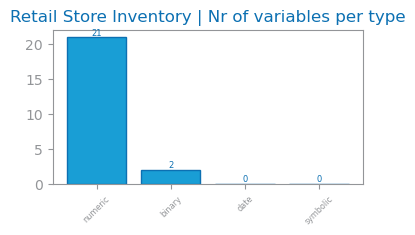

In [12]:
counts: dict[str, int] = {}
for tp in variable_types.keys():
    counts[tp] = len(variable_types[tp])

figure(figsize=(4, 2))
plot_bar_chart(
    list(counts.keys()), list(counts.values()), title=f"{file_tag} | Nr of variables per type"
)
# savefig(f"{file_tag}_variable_types.png")
show()

# Data Distribution

## describe

In [13]:
summary5: DataFrame = data.describe(include="all")
summary5

,Holiday/Promotion,nunique_Demand Forecast_East,nunique_Demand Forecast_North,nunique_Demand Forecast_South,nunique_Demand Forecast_West,nunique_Inventory Level_East,nunique_Inventory Level_North,nunique_Inventory Level_South,nunique_Inventory Level_West,nunique_Units Ordered_East,...,nunique_Units Sold_East,nunique_Units Sold_North,nunique_Units Sold_South,nunique_Units Sold_West,total_Inventory Level,total_Units Sold,total_Units Ordered,total_Demand Forecast,day_of_week_nr,is_weekend
count,1462.000000,1462.000000,1462.000000,1462.000000,1462.000000,1462.000000,1462.000000,1462.000000,1462.000000,1462.000000,...,1462.000000,1462.000000,1462.000000,1462.000000,1462.000000,1462.000000,1462.000000,1462.000000,1462.000000,1462.000000
mean,0.500000,1779.229918,1762.322777,1779.355164,1753.828146,3455.092339,3426.123803,3445.558140,3396.719562,1380.245554,...,1717.691518,1699.703146,1715.320793,1690.528044,27446.987688,13646.487004,11000.447332,14149.472011,3.002736,0.287278
std,0.500171,604.241337,597.737882,610.261336,601.173314,1005.118239,998.710107,1019.246297,1020.428084,401.258040,...,590.114995,583.636342,595.911687,586.988824,1275.728949,1031.605737,517.981327,1041.548637,2.004101,0.452647
min,0.000000,340.720000,287.770000,279.740000,81.480000,892.000000,450.000000,444.000000,279.000000,281.000000,...,317.000000,279.000000,253.000000,77.000000,23643.000000,10642.000000,9236.000000,11063.290000,0.000000,0.000000
25%,0.000000,1349.755000,1337.075000,1340.317500,1341.620000,2731.250000,2705.000000,2726.250000,2691.500000,1101.250000,...,1301.750000,1286.500000,1288.000000,1286.750000,26544.000000,12980.500000,10653.750000,13448.492500,1.000000,0.000000
50%,0.500000,1732.090000,1700.865000,1736.510000,1716.875000,3408.000000,3404.000000,3360.000000,3361.000000,1367.000000,...,1666.000000,1634.000000,1684.000000,1647.000000,27496.000000,13673.000000,11013.000000,14187.370000,3.000000,0.000000
75%,1.000000,2170.657500,2163.232500,2141.205000,2127.937500,4076.500000,4056.750000,4092.000000,4052.750000,1637.750000,...,2094.250000,2086.250000,2065.750000,2062.500000,28283.000000,14323.750000,11343.750000,14861.142500,5.000000,1.000000
max,1.000000,4302.890000,3834.080000,4184.140000,4059.600000,7010.000000,7507.000000,7760.000000,6842.000000,3057.000000,...,4177.000000,3706.000000,4034.000000,3975.000000,31112.000000,17239.000000,12724.000000,17728.880000,6.000000,1.000000


## Numeric Variables

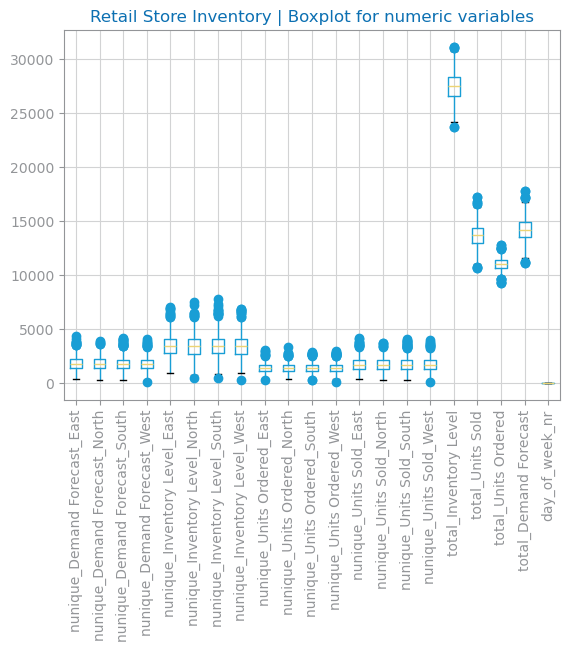

In [14]:
from matplotlib.pyplot import savefig, show, title


variables_types: dict[str, list] = get_variable_types(data)
numeric: list[str] = variable_types["numeric"]


if [] != numeric:
    data[numeric].boxplot(rot=90)
    title(f'{file_tag} | Boxplot for numeric variables')  # Correct way to set title
    savefig(f"images/{file_tag}_global_boxplot.png")
    show()
else:
    print("There are no numeric variables.")

# multivariate chart

Nr. Records =  (1462, 23)
First timestamp 2022-01-01 00:00:00
Last timestamp 2024-01-01 00:00:00


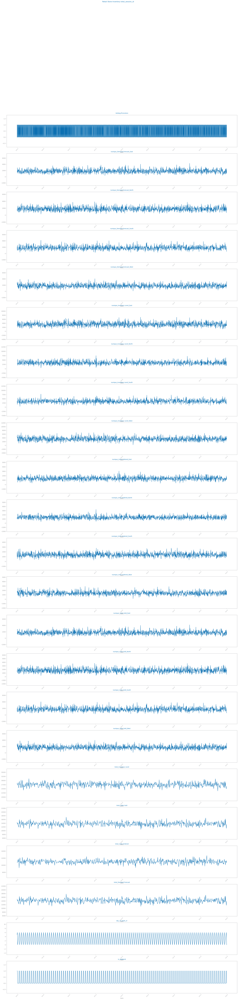

In [15]:
print("Nr. Records = ", data.shape)
print("First timestamp", data.index[0])
print("Last timestamp", data.index[-1])


target = "total_session_id"


plot_ts_multivariate_chart(data, title=f"{file_tag} {target}")
show()

# numeric variables distribution breakdown

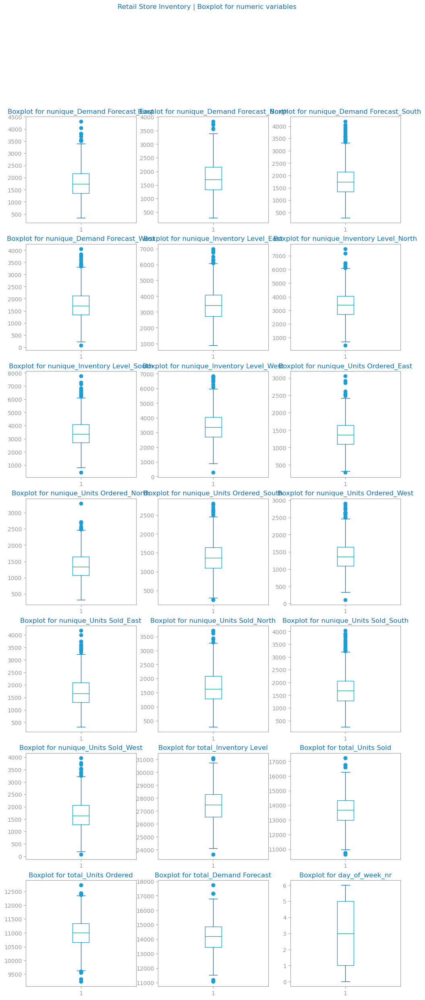

In [16]:
from numpy import ndarray
from matplotlib.figure import Figure
from matplotlib.pyplot import savefig, show, subplots
from dslabs_functions import define_grid, HEIGHT

if [] != numeric:
    rows: int
    cols: int
    rows, cols = define_grid(len(numeric))
    fig: Figure
    axs: ndarray
    title: f'{file_tag} Boxplot for numeric variables'
    fig, axs = subplots(
        rows, cols, figsize=(cols * HEIGHT, rows * HEIGHT), squeeze=False
    )
    
    fig.suptitle(f'{file_tag} | Boxplot for numeric variables')

    
    i, j = 0, 0
    for n in range(len(numeric)):
        axs[i, j].set_title("Boxplot for %s" % numeric[n])
        axs[i, j].boxplot(data[numeric[n]].dropna().values)
        i, j = (i + 1, 0) if (n + 1) % cols == 0 else (i, j + 1)
    savefig(f"images/{file_tag}_single_boxplots.png")
    show()
else:
    print("There are no numeric variables.")

# Sparsity
Heavy processing. using 1% sample

In [17]:
from numpy import ndarray
from pandas import DataFrame
from matplotlib.figure import Figure
from matplotlib.pyplot import figure, subplots, savefig, show
from dslabs_functions import HEIGHT, plot_multi_scatters_chart

# sampled_data = sampled_data.dropna()

vars: list = data.columns.to_list()
if [] != vars:
    target = "returning_user"

    n: int = len(vars) - 1
    fig: Figure
    axs: ndarray
    fig, axs = subplots(n, n, figsize=(n * HEIGHT, n * HEIGHT), squeeze=False)

    fig.suptitle(f'{file_tag} | Sparsity Study')

    
    for i in range(len(vars)):
        var1: str = vars[i]
        for j in range(i + 1, len(vars)):
            var2: str = vars[j]
            plot_multi_scatters_chart(data, var1, var2, ax=axs[i, j - 1])
    savefig(f"images/{file_tag}_sparsity_study.png")
    show()
else:
    print("Sparsity class: there are no variables.")

# Correlation Analysis

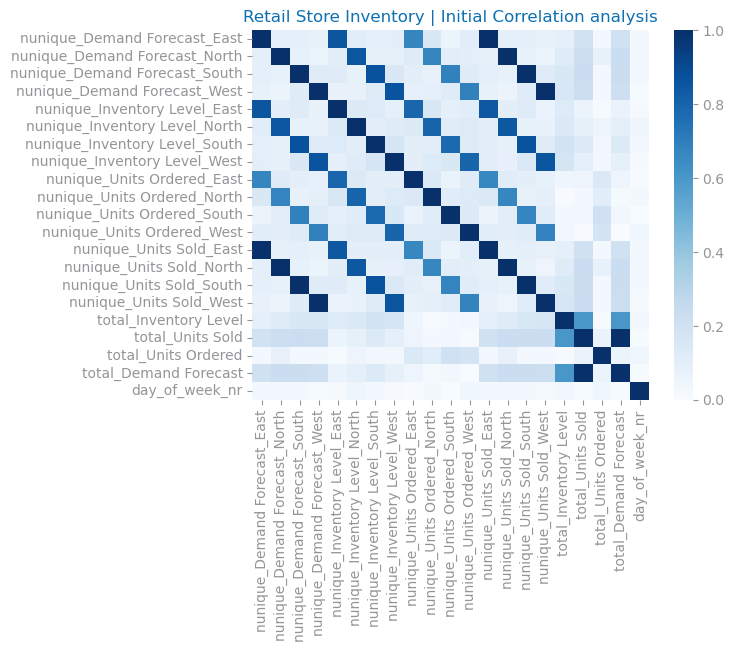

In [18]:
from seaborn import heatmap
from dslabs_functions import get_variable_types
from matplotlib.pyplot import figure, title, savefig, show

variables_types: dict[str, list] = get_variable_types(data)
numeric: list[str] = variables_types["numeric"]
corr_mtx: DataFrame = data[numeric].corr().abs()

figure()
heatmap(
    abs(corr_mtx),
    xticklabels=numeric,
    yticklabels=numeric,
    annot=False,
    cmap="Blues",
    vmin=0,
    vmax=1,
)

title(f'{file_tag} | Initial Correlation analysis')

savefig(f"images/{file_tag}_correlation_analysis.png")
show()